# ENNCA2026 Project — Super Resolution
## Student ID: 342050  (even → 4X upsampling)

This notebook implements the full ENNCA2026 project per the brief:

**Float training**
1. Train the original RGB RPQNet_WSDR_EV2 model
2. Train the Y-channel-only model (input/output grayscale Y)
3. For Y model, U/V channels are bicubic-upsampled and recombined with SR-Y to form full SR-RGB results, per the brief
4. TensorBoard logs of Loss/train, Loss/val, PSNR/train, PSNR/val, LR
5. Sample SR images from validation set (excluded from training)
6. Comparison of params/FLOPs of the model and its collapsed version + MSE pre/post collapse
7. Comparison of params/FLOPs of RGB and Y-channel models and their PSNR (computed in the same RGB domain for fairness)

**Quantization**
1. PTQ per-channel + per-tensor on the collapsed model — PSNR comparison + sample images
2. QAT per-channel + per-tensor — PSNR comparison + sample images

**Pruning**
1. Unstructured magnitude pruning (10/30/50%) iterative + fine-tune
2. Layer-wise pruning by PSNR sensitivity over **all** conv layers + fine-tune


## 1. Data Downloading
Download HR images and 4X LR images for the project.

In [6]:
# Data preparation (local Windows-friendly).
# All four DIV2K zips should already be in the same folder as this notebook.
# This cell will unzip them in-place if their target folders don't already exist.

import os, zipfile

DATA_DIR = os.getcwd()

zips = {
    "DIV2K_train_HR.zip":            "DIV2K_train_HR",
    "DIV2K_valid_HR.zip":            "DIV2K_valid_HR",
    "DIV2K_train_LR_bicubic_X4.zip": "DIV2K_train_LR_bicubic",
    "DIV2K_valid_LR_bicubic_X4.zip": "DIV2K_valid_LR_bicubic",
}

for zip_name, expected_folder in zips.items():
    zip_path = os.path.join(DATA_DIR, zip_name)
    out_dir  = os.path.join(DATA_DIR, expected_folder)
    if os.path.isdir(out_dir) and os.listdir(out_dir):
        print(f"[skip] {expected_folder} already exists")
        continue
    if not os.path.isfile(zip_path):
        print(f"[MISSING] {zip_name} not found in {DATA_DIR} -- please add it and re-run this cell")
        continue
    print(f"[unzip] {zip_name} -> {DATA_DIR}")
    with zipfile.ZipFile(zip_path, "r") as zf:
        zf.extractall(DATA_DIR)

print("\nFolder contents:")
for entry in sorted(os.listdir(DATA_DIR)):
    print(" ", entry)


[skip] DIV2K_train_HR already exists
[skip] DIV2K_valid_HR already exists
[skip] DIV2K_train_LR_bicubic already exists
[skip] DIV2K_valid_LR_bicubic already exists

Folder contents:
  .venv
  DIV2K_train_HR
  DIV2K_train_HR.zip
  DIV2K_train_LR_bicubic
  DIV2K_train_LR_bicubic_X4.zip
  DIV2K_valid_HR
  DIV2K_valid_HR.zip
  DIV2K_valid_LR_bicubic
  DIV2K_valid_LR_bicubic_X4.zip
  ENNCA2026_project_342050.ipynb
  README_RUN.md
  checkpoints
  requirements.txt
  results
  runs
  setup.bat
  unzip_data.py


## 2. Imports and Configuration

In [7]:
import os
import math
import random
import copy
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, Subset
from torch.amp import autocast, GradScaler
from torch.utils.tensorboard import SummaryWriter
import torchvision.transforms as transforms
import torchvision.transforms.functional as TF
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

# ── Configuration ──
UPSCALE      = 4          # Even student number -> 4X
NUM_EPOCHS   = 50
BATCH_SIZE   = 16
LR           = 1e-4
DEVICE       = torch.device("cuda" if torch.cuda.is_available() else "cpu")
USE_AMP      = (DEVICE.type == "cuda")           # mixed precision only on GPU
AMP_DEVICE   = "cuda" if USE_AMP else "cpu"
NUM_WORKERS  = 0          # Windows + Jupyter friendly

PROJECT_DIR  = os.path.abspath(os.getcwd())
SAVE_DIR     = os.path.join(PROJECT_DIR, "checkpoints")
RUNS_DIR     = os.path.join(PROJECT_DIR, "runs")
RESULTS_DIR  = os.path.join(PROJECT_DIR, "results")
os.makedirs(SAVE_DIR,    exist_ok=True)
os.makedirs(RUNS_DIR,    exist_ok=True)
os.makedirs(RESULTS_DIR, exist_ok=True)

LR_TRAIN = os.path.join(PROJECT_DIR, "DIV2K_train_LR_bicubic", "X4")
HR_TRAIN = os.path.join(PROJECT_DIR, "DIV2K_train_HR")
LR_VAL   = os.path.join(PROJECT_DIR, "DIV2K_valid_LR_bicubic", "X4")
HR_VAL   = os.path.join(PROJECT_DIR, "DIV2K_valid_HR")

print(f"Device: {DEVICE} | AMP: {USE_AMP}")
print(f"Upscale: {UPSCALE}X")
print(f"Project dir: {PROJECT_DIR}")


Device: cuda | AMP: True
Upscale: 4X
Project dir: c:\Users\mshyb\Downloads\NN Project


## 3. Dataset and Transforms

In [8]:
class DIV2KDataset(Dataset):
    def __init__(self, lr_dir, hr_dir, transform=None):
        self.lr_dir    = lr_dir
        self.hr_dir    = hr_dir
        self.transform = transform
        self.lr_images = sorted([f for f in os.listdir(lr_dir)
                                 if f.lower().endswith(('.png','.jpg','.jpeg'))])
        self.hr_images = sorted([f for f in os.listdir(hr_dir)
                                 if f.lower().endswith(('.png','.jpg','.jpeg'))])
        assert len(self.lr_images) == len(self.hr_images), "LR/HR count mismatch"

    def __len__(self):
        return len(self.lr_images)

    def __getitem__(self, idx):
        lr = Image.open(os.path.join(self.lr_dir, self.lr_images[idx])).convert('RGB')
        hr = Image.open(os.path.join(self.hr_dir, self.hr_images[idx])).convert('RGB')
        if self.transform:
            lr, hr = self.transform(lr, hr)
        return {'lr': lr, 'hr': hr}


class RandomCropSR:
    def __init__(self, crop_size, scale):
        self.crop_size = crop_size
        self.scale     = scale

    def __call__(self, lr, hr):
        lr_w, lr_h = lr.size
        x = random.randint(0, lr_w - self.crop_size)
        y = random.randint(0, lr_h - self.crop_size)
        lr = TF.crop(lr, y, x, self.crop_size, self.crop_size)
        hr = TF.crop(hr, y * self.scale, x * self.scale,
                     self.crop_size * self.scale, self.crop_size * self.scale)
        return lr, hr


class RandomFlipSR:
    def __call__(self, lr, hr):
        if random.random() > 0.5:
            lr = TF.hflip(lr)
            hr = TF.hflip(hr)
        if random.random() > 0.5:
            lr = TF.vflip(lr)
            hr = TF.vflip(hr)
        return lr, hr


class ToTensorSR:
    def __call__(self, lr, hr):
        return TF.to_tensor(lr), TF.to_tensor(hr)


class ComposeSR:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, lr, hr):
        for t in self.transforms:
            lr, hr = t(lr, hr)
        return lr, hr


train_tf = ComposeSR([RandomCropSR(48, UPSCALE), RandomFlipSR(), ToTensorSR()])
val_tf   = ComposeSR([ToTensorSR()])

train_dataset = DIV2KDataset(LR_TRAIN, HR_TRAIN, transform=train_tf)
val_dataset   = DIV2KDataset(LR_VAL,   HR_VAL,   transform=val_tf)
train_loader  = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True,  num_workers=NUM_WORKERS, pin_memory=True)
val_loader    = DataLoader(val_dataset,   batch_size=1,          shuffle=False, num_workers=NUM_WORKERS)

print(f"Train: {len(train_dataset)} | Val: {len(val_dataset)}")


Train: 800 | Val: 100


## 4. Model Definition (RPQNet_WSDR_EV2)

In [9]:
class CLB_A(nn.Module):
    """Collapsible Linear Block - Type A (1x3 conv)"""
    def __init__(self, in_channels, out_channels, expand_ratio=4, use_skip=True):
        super().__init__()
        self.use_skip       = use_skip and (in_channels == out_channels)
        mid = int(in_channels * expand_ratio)
        self.conv_expand1x1 = nn.Conv2d(in_channels, mid, 1, bias=True)
        self.conv_1x3       = nn.Conv2d(mid, mid, (1, 3), padding=(0, 1), bias=True)
        self.conv_reduce1x1 = nn.Conv2d(mid, out_channels, 1, bias=True)
        self.conv_reparam   = nn.Conv2d(in_channels, out_channels, (1, 3), padding=(0, 1), bias=True)
        self.deploy = False

    def forward(self, x):
        if not self.deploy:
            out = self.conv_expand1x1(x)
            out = self.conv_1x3(out)
            out = self.conv_reduce1x1(out)
            if self.use_skip:
                out = out + x
            return F.relu(out, inplace=True)
        else:
            out = self.conv_reparam(x)
            return F.relu(out, inplace=True)

    def switch_to_deploy(self):
        if self.deploy:
            return
        A = self.conv_expand1x1.weight; A_b = self.conv_expand1x1.bias
        B = self.conv_1x3.weight;       B_b = self.conv_1x3.bias
        C = self.conv_reduce1x1.weight; C_b = self.conv_reduce1x1.bias
        A_r = A.reshape(A.shape[0], A.shape[1])
        F1  = torch.einsum('omuv,mi->oiuv', B, A_r)
        b1  = B_b + torch.matmul(B.sum(dim=(2,3)), A_b)
        C_r = C.reshape(C.shape[0], C.shape[1])
        fk  = torch.einsum('om,miuv->oiuv', C_r, F1)
        fb  = C_b + torch.matmul(C_r, b1)
        if self.use_skip:
            identity = torch.zeros_like(fk)
            for i in range(self.conv_reparam.out_channels):
                identity[i, i, 0, 1] = 1.0
            fk = fk + identity
        self.conv_reparam.weight.data.copy_(fk)
        self.conv_reparam.bias.data.copy_(fb)
        self.deploy = True
        # Free the (now unused) expanded conv layers so params count truly drops.
        del self.conv_expand1x1, self.conv_1x3, self.conv_reduce1x1


class CLB_B(nn.Module):
    """Collapsible Linear Block - Type B (3x1 conv)"""
    def __init__(self, in_channels, out_channels, expand_ratio=4, use_skip=True):
        super().__init__()
        self.use_skip       = use_skip and (in_channels == out_channels)
        mid = int(in_channels * expand_ratio)
        self.conv_expand1x1 = nn.Conv2d(in_channels, mid, 1, bias=True)
        self.conv_3x1       = nn.Conv2d(mid, mid, (3, 1), padding=(1, 0), bias=True)
        self.conv_reduce1x1 = nn.Conv2d(mid, out_channels, 1, bias=True)
        self.conv_reparam   = nn.Conv2d(in_channels, out_channels, (3, 1), padding=(1, 0), bias=True)
        self.deploy = False

    def forward(self, x):
        if not self.deploy:
            out = self.conv_expand1x1(x)
            out = self.conv_3x1(out)
            out = self.conv_reduce1x1(out)
            if self.use_skip:
                out = out + x
            return F.relu(out, inplace=True)
        else:
            out = self.conv_reparam(x)
            return F.relu(out, inplace=True)

    def switch_to_deploy(self):
        if self.deploy:
            return
        A = self.conv_expand1x1.weight; A_b = self.conv_expand1x1.bias
        B = self.conv_3x1.weight;       B_b = self.conv_3x1.bias
        C = self.conv_reduce1x1.weight; C_b = self.conv_reduce1x1.bias
        A_r = A.reshape(A.shape[0], A.shape[1])
        F1  = torch.einsum('omuv,mi->oiuv', B, A_r)
        b1  = B_b + torch.matmul(B.sum(dim=(2,3)), A_b)
        C_r = C.reshape(C.shape[0], C.shape[1])
        fk  = torch.einsum('om,miuv->oiuv', C_r, F1)
        fb  = C_b + torch.matmul(C_r, b1)
        if self.use_skip:
            identity = torch.zeros_like(fk)
            for i in range(self.conv_reparam.out_channels):
                identity[i, i, 1, 0] = 1.0
            fk = fk + identity
        self.conv_reparam.weight.data.copy_(fk)
        self.conv_reparam.bias.data.copy_(fb)
        self.deploy = True
        # Free the (now unused) expanded conv layers so params count truly drops.
        del self.conv_expand1x1, self.conv_3x1, self.conv_reduce1x1


class RPQNet_WSDR_EV2(nn.Module):
    def __init__(self, in_channels=3, num_features=48, num_blocks=6, upscale=4, expand_ratio=4):
        super().__init__()
        self.upscale = upscale
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels, num_features, 3, padding=1), nn.ReLU()
        )
        self.skip_a = nn.Conv2d(in_channels, in_channels*(upscale**2), (5,1), padding=(2,0))
        self.skip_b = nn.Conv2d(in_channels*(upscale**2), in_channels*(upscale**2), (1,5), padding=(0,2))
        self.blocks_a = nn.ModuleList([
            CLB_A(num_features, num_features, expand_ratio, use_skip=True) for _ in range(num_blocks)
        ])
        self.blocks_b = nn.ModuleList([
            CLB_B(num_features, num_features, expand_ratio, use_skip=True) for _ in range(num_blocks)
        ])
        self.reconstruction = nn.Conv2d(num_features, in_channels*(upscale**2), 3, padding=1)
        self.pixel_shuffle  = nn.PixelShuffle(upscale)

    def forward(self, x):
        s   = self.skip_b(self.skip_a(x))
        out = self.initial(x)
        for a, b in zip(self.blocks_a, self.blocks_b):
            out = a(out)
            out = b(out)
        out = self.pixel_shuffle(self.reconstruction(out))
        s   = self.pixel_shuffle(s)
        return out + s

    def switch_to_deploy(self):
        for blk in self.blocks_a: blk.switch_to_deploy()
        for blk in self.blocks_b: blk.switch_to_deploy()


def psnr(mse, max_val=1.0):
    if mse == 0: return 100.0
    return 20 * math.log10(max_val / math.sqrt(mse))

def count_params(model):
    return sum(p.numel() for p in model.parameters())

def count_flops(model, in_channels=3, h=64, w=64):
    """Rough FLOPs estimate using forward hooks (counts conv MACs * 2)."""
    flops = [0]
    hooks = []
    def hook(m, inp, out):
        if isinstance(m, nn.Conv2d):
            b, c_out, oh, ow = out.shape
            _, c_in, kh, kw  = m.weight.shape
            flops[0] += b * c_out * oh * ow * c_in * kh * kw * 2
    for m in model.modules():
        hooks.append(m.register_forward_hook(hook))
    x = torch.zeros(1, in_channels, h, w).to(next(model.parameters()).device)
    with torch.no_grad(): model(x)
    for h_ in hooks: h_.remove()
    return flops[0]

print("Model classes defined!")


Model classes defined!


## 5. Training Function

In [10]:
def train_model(model, train_loader, val_loader, num_epochs, lr, save_path, log_dir, device):
    """Train an SR model with L1 loss, AMP, and cosine-annealing LR.
    
    Logs Loss/train, Loss/val, PSNR/train, PSNR/val, and LR per epoch
    to TensorBoard (covers the brief's tensorboard requirement).
    """
    model     = model.to(device)
    criterion = nn.L1Loss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    # Cosine annealing matches the doctor's reference (sr&mixed_precision_training.ipynb)
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs, eta_min=1e-6)
    scaler    = GradScaler(AMP_DEVICE, enabled=USE_AMP)
    writer    = SummaryWriter(log_dir)
    best_psnr = 0.0

    for epoch in range(num_epochs):
        # ── Train ──
        model.train()
        train_loss = 0.0
        train_mse  = 0.0
        for batch in train_loader:
            lr_imgs = batch['lr'].to(device)
            hr_imgs = batch['hr'].to(device)
            optimizer.zero_grad()
            with autocast(AMP_DEVICE, enabled=USE_AMP):
                out  = model(lr_imgs)
                loss = criterion(out, hr_imgs)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            train_loss += loss.item()
            with torch.no_grad():
                train_mse += F.mse_loss(out.float(), hr_imgs).item()
        train_loss /= len(train_loader)
        train_mse  /= len(train_loader)
        train_psnr  = psnr(train_mse)

        # ── Validate ──
        model.eval()
        val_mse = 0.0
        val_l1  = 0.0
        with torch.no_grad():
            for batch in val_loader:
                lr_imgs = batch['lr'].to(device)
                hr_imgs = batch['hr'].to(device)
                with autocast(AMP_DEVICE, enabled=USE_AMP):
                    out = model(lr_imgs)
                val_mse += F.mse_loss(out.float(), hr_imgs).item()
                val_l1  += F.l1_loss(out.float(),  hr_imgs).item()
        val_mse  /= len(val_loader)
        val_l1   /= len(val_loader)
        val_psnr  = psnr(val_mse)

        # ── Log ──
        cur_lr = optimizer.param_groups[0]['lr']
        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/val',   val_l1,     epoch)
        writer.add_scalar('PSNR/train', train_psnr, epoch)
        writer.add_scalar('PSNR/val',   val_psnr,   epoch)
        writer.add_scalar('LR',         cur_lr,     epoch)

        scheduler.step()

        print(f"Epoch [{epoch+1}/{num_epochs}] "
              f"Loss: {train_loss:.4f} | TrPSNR: {train_psnr:.2f} | "
              f"ValPSNR: {val_psnr:.2f} | LR: {cur_lr:.6f}")

        if val_psnr > best_psnr:
            best_psnr = val_psnr
            torch.save(model.state_dict(), save_path)
            print(f"  ✓ Saved (PSNR: {val_psnr:.2f} dB)")

    writer.close()
    print(f"\nDone! Best PSNR: {best_psnr:.2f} dB")
    return best_psnr


## 6. Float Training - RGB Model (4X)

In [11]:
# ── Create RGB model ──
model_rgb = RPQNet_WSDR_EV2(in_channels=3, num_features=48, num_blocks=6, upscale=UPSCALE, expand_ratio=4)
print(f"RGB Model Parameters: {count_params(model_rgb):,}")

# ── Train ──
best_psnr_rgb = train_model(
    model_rgb, train_loader, val_loader,
    num_epochs  = NUM_EPOCHS,
    lr          = LR,
    save_path   = f'{SAVE_DIR}/rgb_4x_best.pth',
    log_dir     = os.path.join(RUNS_DIR, 'rgb_4x'),
    device      = DEVICE
)


RGB Model Parameters: 1,671,456
Epoch [1/50] Loss: 0.1805 | TrPSNR: 10.98 | ValPSNR: 17.84 | LR: 0.000100
  ✓ Saved (PSNR: 17.84 dB)
Epoch [2/50] Loss: 0.0918 | TrPSNR: 17.18 | ValPSNR: 19.75 | LR: 0.000100
  ✓ Saved (PSNR: 19.75 dB)
Epoch [3/50] Loss: 0.0744 | TrPSNR: 18.69 | ValPSNR: 20.61 | LR: 0.000100
  ✓ Saved (PSNR: 20.61 dB)
Epoch [4/50] Loss: 0.0661 | TrPSNR: 19.50 | ValPSNR: 21.24 | LR: 0.000099
  ✓ Saved (PSNR: 21.24 dB)
Epoch [5/50] Loss: 0.0608 | TrPSNR: 20.21 | ValPSNR: 21.71 | LR: 0.000098
  ✓ Saved (PSNR: 21.71 dB)
Epoch [6/50] Loss: 0.0563 | TrPSNR: 20.83 | ValPSNR: 22.20 | LR: 0.000098
  ✓ Saved (PSNR: 22.20 dB)
Epoch [7/50] Loss: 0.0531 | TrPSNR: 21.27 | ValPSNR: 22.45 | LR: 0.000097
  ✓ Saved (PSNR: 22.45 dB)
Epoch [8/50] Loss: 0.0538 | TrPSNR: 21.28 | ValPSNR: 22.70 | LR: 0.000095
  ✓ Saved (PSNR: 22.70 dB)
Epoch [9/50] Loss: 0.0482 | TrPSNR: 21.98 | ValPSNR: 22.69 | LR: 0.000094
Epoch [10/50] Loss: 0.0486 | TrPSNR: 22.16 | ValPSNR: 22.85 | LR: 0.000092
  ✓ Saved (

## 7. Float Training - Y Channel Only Model (4X)

In [12]:
def rgb_to_y_channel(img_tensor):
    """Convert RGB tensor [C,H,W] to Y channel (grayscale luma) [1,H,W] (BT.601)."""
    r, g, b = img_tensor[0:1], img_tensor[1:2], img_tensor[2:3]
    y = 0.299 * r + 0.587 * g + 0.114 * b
    return y

class DIV2KDatasetY(Dataset):
    """Dataset that returns Y-channel only images (for Y-only training)."""
    def __init__(self, lr_dir, hr_dir, transform=None):
        self.base = DIV2KDataset(lr_dir, hr_dir, transform)

    def __len__(self):
        return len(self.base)

    def __getitem__(self, idx):
        sample = self.base[idx]
        lr_y = rgb_to_y_channel(sample['lr'])
        hr_y = rgb_to_y_channel(sample['hr'])
        return {'lr': lr_y, 'hr': hr_y}

train_dataset_y = DIV2KDatasetY(LR_TRAIN, HR_TRAIN, transform=train_tf)
val_dataset_y   = DIV2KDatasetY(LR_VAL,   HR_VAL,   transform=val_tf)
train_loader_y  = DataLoader(train_dataset_y, batch_size=BATCH_SIZE, shuffle=True,
                              num_workers=NUM_WORKERS, pin_memory=True)
val_loader_y    = DataLoader(val_dataset_y,   batch_size=1, shuffle=False,
                              num_workers=NUM_WORKERS)

# ── Create Y model (in_channels=1) ──
model_y = RPQNet_WSDR_EV2(in_channels=1, num_features=48, num_blocks=6,
                          upscale=UPSCALE, expand_ratio=4)
print(f"Y Model Parameters: {count_params(model_y):,}")

best_psnr_y = train_model(
    model_y, train_loader_y, val_loader_y,
    num_epochs  = NUM_EPOCHS,
    lr          = LR,
    save_path   = f'{SAVE_DIR}/y_4x_best.pth',
    log_dir     = os.path.join(RUNS_DIR, 'y_4x'),
    device      = DEVICE
)


Y Model Parameters: 1,645,792
Epoch [1/50] Loss: 0.1598 | TrPSNR: 11.32 | ValPSNR: 19.65 | LR: 0.000100
  ✓ Saved (PSNR: 19.65 dB)
Epoch [2/50] Loss: 0.0756 | TrPSNR: 17.73 | ValPSNR: 20.66 | LR: 0.000100
  ✓ Saved (PSNR: 20.66 dB)
Epoch [3/50] Loss: 0.0665 | TrPSNR: 18.94 | ValPSNR: 21.45 | LR: 0.000100
  ✓ Saved (PSNR: 21.45 dB)
Epoch [4/50] Loss: 0.0583 | TrPSNR: 20.06 | ValPSNR: 21.79 | LR: 0.000099
  ✓ Saved (PSNR: 21.79 dB)
Epoch [5/50] Loss: 0.0584 | TrPSNR: 20.30 | ValPSNR: 22.33 | LR: 0.000098
  ✓ Saved (PSNR: 22.33 dB)
Epoch [6/50] Loss: 0.0516 | TrPSNR: 21.27 | ValPSNR: 22.75 | LR: 0.000098
  ✓ Saved (PSNR: 22.75 dB)
Epoch [7/50] Loss: 0.0496 | TrPSNR: 21.78 | ValPSNR: 22.78 | LR: 0.000097
  ✓ Saved (PSNR: 22.78 dB)
Epoch [8/50] Loss: 0.0453 | TrPSNR: 22.37 | ValPSNR: 23.41 | LR: 0.000095
  ✓ Saved (PSNR: 23.41 dB)
Epoch [9/50] Loss: 0.0485 | TrPSNR: 22.28 | ValPSNR: 23.52 | LR: 0.000094
  ✓ Saved (PSNR: 23.52 dB)
Epoch [10/50] Loss: 0.0408 | TrPSNR: 23.22 | ValPSNR: 23.85 |

## 7b. YUV Reconstruction Helpers (per brief)

> *"The UV channels should be upsampled using linear interpolation and combined with results
> from the model to form super resolution YUV results."*

The Y model is trained on Y-only data (input/output grayscale). For evaluation/visualization,
we recombine the SR-Y output with **bicubically-upsampled U/V** channels and convert back to RGB.
This makes Y-vs-RGB comparison fair (same RGB domain).


In [13]:
# ── BT.601 RGB ↔ YUV ──
def rgb_to_yuv(img):
    """RGB tensor (C,H,W) in [0,1] → YUV tensor (C,H,W). BT.601 full-range."""
    r, g, b = img[0:1], img[1:2], img[2:3]
    y =  0.299    * r + 0.587   * g + 0.114   * b
    u = -0.14713  * r - 0.28886 * g + 0.436   * b
    v =  0.615    * r - 0.51499 * g - 0.10001 * b
    return torch.cat([y, u, v], dim=0)

def yuv_to_rgb(img):
    """YUV tensor (C,H,W) → RGB tensor (C,H,W). BT.601 inverse."""
    y, u, v = img[0:1], img[1:2], img[2:3]
    r = y               + 1.13983 * v
    g = y - 0.39465 * u - 0.58060 * v
    b = y + 2.03211 * u
    return torch.cat([r, g, b], dim=0)

def y_model_super_resolve(model_y, lr_rgb_batch, scale, device):
    """Super-resolve a batch of LR RGB images using the Y-only model and
    bicubic-upsampled UV channels (per brief).

    Returns (B, 3, H, W) RGB super-resolution batch (clamped to [0,1])."""
    model_y.eval()
    sr_rgb_list = []
    with torch.no_grad():
        for i in range(lr_rgb_batch.shape[0]):
            lr_yuv = rgb_to_yuv(lr_rgb_batch[i].cpu())
            lr_y   = lr_yuv[0:1].unsqueeze(0).to(device)
            lr_uv  = lr_yuv[1:3].unsqueeze(0).to(device)
            sr_y   = model_y(lr_y).squeeze(0)
            sr_uv  = F.interpolate(lr_uv, scale_factor=scale,
                                    mode='bilinear', align_corners=False).squeeze(0)
            sr_yuv = torch.cat([sr_y, sr_uv], dim=0)
            sr_rgb = yuv_to_rgb(sr_yuv).clamp(0, 1)
            sr_rgb_list.append(sr_rgb)
    return torch.stack(sr_rgb_list)


def evaluate_y_model_yuv(model_y, val_loader, device, scale):
    """Evaluate the Y-only model with YUV reconstruction; return RGB-domain PSNR."""
    total_mse, n = 0.0, 0
    with torch.no_grad():
        for batch in val_loader:
            lr_rgb = batch['lr'].to(device)
            hr_rgb = batch['hr'].to(device)
            sr_rgb = y_model_super_resolve(model_y, lr_rgb, scale, device)
            _, _, H, W = hr_rgb.shape
            sr_rgb = sr_rgb[..., :H, :W]
            total_mse += F.mse_loss(sr_rgb, hr_rgb).item()
            n += 1
    return psnr(total_mse / n)

print("YUV reconstruction helpers ready.")


YUV reconstruction helpers ready.


## 8. Comparison: RGB vs Y-Channel Model

In [14]:
# ── Parameters & FLOPs ──
flops_rgb = count_flops(model_rgb.to(DEVICE), in_channels=3, h=64, w=64)
flops_y   = count_flops(model_y.to(DEVICE),   in_channels=1, h=64, w=64)

# ── Load best Y checkpoint and compute RGB-domain PSNR via YUV reconstruction
# (per brief: SR-Y + bicubic UV → RGB, then PSNR vs HR RGB)
model_y.load_state_dict(torch.load(f'{SAVE_DIR}/y_4x_best.pth',
                                    map_location=DEVICE, weights_only=True))
model_y = model_y.to(DEVICE).eval()
psnr_y_rgb_eq = evaluate_y_model_yuv(model_y, val_loader, DEVICE, UPSCALE)

print("=" * 72)
print(f"{'Model':<26} {'Params':>12} {'FLOPs':>17} {'PSNR (RGB)':>12}")
print("=" * 72)
print(f"{'RGB (4X)':<26} {count_params(model_rgb):>12,} {flops_rgb:>17,} {best_psnr_rgb:>12.2f}")
print(f"{'Y-ch + bicubic UV (4X)':<26} {count_params(model_y):>12,} {flops_y:>17,} {psnr_y_rgb_eq:>12.2f}")
print("=" * 72)
print()
print("Notes:")
print(f"  RGB model PSNR : measured on full RGB output vs HR.")
print(f"  Y-ch model PSNR: SR-Y combined with bicubic-upsampled U/V channels,")
print(f"                   converted back to RGB, and compared with HR RGB")
print(f"                   (this is the fair RGB-domain comparison the brief asks for).")
print(f"  Y-only PSNR (Y channel alone, for reference): {best_psnr_y:.2f} dB")


Model                            Params             FLOPs   PSNR (RGB)
RGB (4X)                      1,671,456    12,964,331,520        24.50
Y-ch + bicubic UV (4X)        1,645,792    12,754,878,464        24.97

Notes:
  RGB model PSNR : measured on full RGB output vs HR.
  Y-ch model PSNR: SR-Y combined with bicubic-upsampled U/V channels,
                   converted back to RGB, and compared with HR RGB
                   (this is the fair RGB-domain comparison the brief asks for).
  Y-only PSNR (Y channel alone, for reference): 25.03 dB


## 8b. TensorBoard Training Curves (inline)

> *"The training should include tensorboard log of training and validation PSNR ..."*

The TensorBoard event files were written to `runs/rgb_4x/` and `runs/y_4x/`
during training. The cell below loads those event files and plots the
recorded scalars (Loss/train, Loss/val, PSNR/train, PSNR/val, LR) inline
so the curves are visible directly in the notebook.

You can also browse the same data interactively with: `tensorboard --logdir runs`.


RGB event file: c:\Users\mshyb\Downloads\NN Project\runs\rgb_4x\events.out.tfevents.1777909483.Al-Duhoun.17772.1
  scalars: ['LR', 'Loss/train', 'Loss/val', 'PSNR/train', 'PSNR/val']
Y   event file: c:\Users\mshyb\Downloads\NN Project\runs\y_4x\events.out.tfevents.1777913768.Al-Duhoun.17772.2
  scalars: ['LR', 'Loss/train', 'Loss/val', 'PSNR/train', 'PSNR/val']


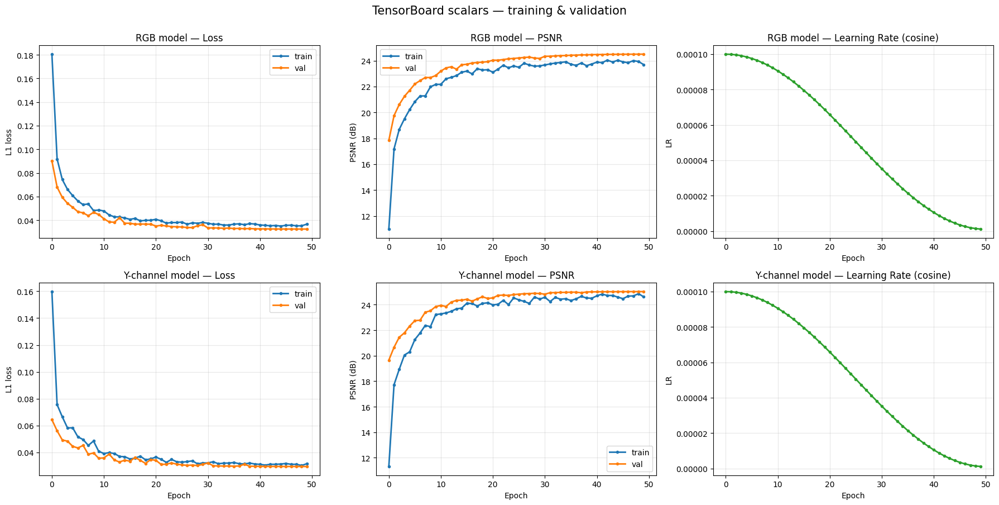


Saved figure to: c:\Users\mshyb\Downloads\NN Project\results\tensorboard_curves.png


In [15]:
# ── Read TensorBoard event files and plot the curves inline ──
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
import glob

def latest_event_file(log_dir):
    """Return the most-recent TF event file in log_dir, or None."""
    events = sorted(glob.glob(os.path.join(log_dir, "events.out.tfevents.*")),
                    key=os.path.getmtime, reverse=True)
    return events[0] if events else None

def load_scalars(log_dir):
    """Return {tag: ([steps], [values])} for the LATEST run in log_dir."""
    ev = latest_event_file(log_dir)
    if ev is None:
        return {}, None
    ea = EventAccumulator(ev, size_guidance={'scalars': 0})
    ea.Reload()
    out = {}
    for tag in ea.Tags().get('scalars', []):
        events = ea.Scalars(tag)
        out[tag] = ([e.step for e in events], [e.value for e in events])
    return out, ev

rgb_log_dir = os.path.join(RUNS_DIR, 'rgb_4x')
y_log_dir   = os.path.join(RUNS_DIR, 'y_4x')

rgb_scalars, rgb_ev = load_scalars(rgb_log_dir)
y_scalars,   y_ev   = load_scalars(y_log_dir)

print(f"RGB event file: {rgb_ev}")
print(f"  scalars: {sorted(rgb_scalars.keys())}")
print(f"Y   event file: {y_ev}")
print(f"  scalars: {sorted(y_scalars.keys())}")

# 2 rows (RGB / Y), 3 columns (Loss, PSNR, LR)
fig, axes = plt.subplots(2, 3, figsize=(18, 9))
plt.subplots_adjust(hspace=0.35, wspace=0.25)

def _plot(ax, scalars, tag, color, label):
    if tag in scalars:
        steps, vals = scalars[tag]
        ax.plot(steps, vals, color=color, linewidth=2, label=label, marker='o', markersize=3)

# ── Row 0: RGB model ──
_plot(axes[0,0], rgb_scalars, 'Loss/train',  'tab:blue',   'train')
_plot(axes[0,0], rgb_scalars, 'Loss/val',    'tab:orange', 'val')
axes[0,0].set_title('RGB model — Loss')
axes[0,0].set_xlabel('Epoch'); axes[0,0].set_ylabel('L1 loss')
axes[0,0].grid(True, alpha=0.3); axes[0,0].legend()

_plot(axes[0,1], rgb_scalars, 'PSNR/train', 'tab:blue',   'train')
_plot(axes[0,1], rgb_scalars, 'PSNR/val',   'tab:orange', 'val')
axes[0,1].set_title('RGB model — PSNR')
axes[0,1].set_xlabel('Epoch'); axes[0,1].set_ylabel('PSNR (dB)')
axes[0,1].grid(True, alpha=0.3); axes[0,1].legend()

_plot(axes[0,2], rgb_scalars, 'LR', 'tab:green', 'LR')
axes[0,2].set_title('RGB model — Learning Rate (cosine)')
axes[0,2].set_xlabel('Epoch'); axes[0,2].set_ylabel('LR')
axes[0,2].grid(True, alpha=0.3)

# ── Row 1: Y model ──
_plot(axes[1,0], y_scalars, 'Loss/train',  'tab:blue',   'train')
_plot(axes[1,0], y_scalars, 'Loss/val',    'tab:orange', 'val')
axes[1,0].set_title('Y-channel model — Loss')
axes[1,0].set_xlabel('Epoch'); axes[1,0].set_ylabel('L1 loss')
axes[1,0].grid(True, alpha=0.3); axes[1,0].legend()

_plot(axes[1,1], y_scalars, 'PSNR/train', 'tab:blue',   'train')
_plot(axes[1,1], y_scalars, 'PSNR/val',   'tab:orange', 'val')
axes[1,1].set_title('Y-channel model — PSNR')
axes[1,1].set_xlabel('Epoch'); axes[1,1].set_ylabel('PSNR (dB)')
axes[1,1].grid(True, alpha=0.3); axes[1,1].legend()

_plot(axes[1,2], y_scalars, 'LR', 'tab:green', 'LR')
axes[1,2].set_title('Y-channel model — Learning Rate (cosine)')
axes[1,2].set_xlabel('Epoch'); axes[1,2].set_ylabel('LR')
axes[1,2].grid(True, alpha=0.3)

plt.suptitle('TensorBoard scalars — training & validation', fontsize=15, y=1.00)
plt.tight_layout()
plt.savefig(os.path.join(RESULTS_DIR, 'tensorboard_curves.png'), dpi=120, bbox_inches='tight')
plt.show()
print(f"\nSaved figure to: {os.path.join(RESULTS_DIR, 'tensorboard_curves.png')}")


## 9. Model Collapse (switch_to_deploy) and MSE Comparison

In [16]:
# Load best RGB model
model_rgb.load_state_dict(torch.load(f'{SAVE_DIR}/rgb_4x_best.pth', map_location=DEVICE, weights_only=True))
model_rgb = model_rgb.to(DEVICE).eval()

# Save output before collapse
sample_batch = next(iter(val_loader))
lr_sample = sample_batch['lr'].to(DEVICE)
hr_sample = sample_batch['hr'].to(DEVICE)

with torch.no_grad():
    out_before = model_rgb(lr_sample)

# Collapse
model_rgb_collapsed = copy.deepcopy(model_rgb)
model_rgb_collapsed.switch_to_deploy()
model_rgb_collapsed.eval()

with torch.no_grad():
    out_after = model_rgb_collapsed(lr_sample)

# MSE between before and after collapse
mse_collapse = F.mse_loss(out_before, out_after).item()
flops_before = count_flops(model_rgb, in_channels=3, h=64, w=64)
flops_after  = count_flops(model_rgb_collapsed, in_channels=3, h=64, w=64)

print("=" * 50)
print(f"{'':25} {'Before':>10} {'After':>10}")
print("=" * 50)
print(f"{'Parameters':<25} {count_params(model_rgb):>10,} {count_params(model_rgb_collapsed):>10,}")
print(f"{'FLOPs':<25} {flops_before:>10,} {flops_after:>10,}")
print("=" * 50)
print(f"MSE between pre/post collapse: {mse_collapse:.8f}")


                              Before      After
Parameters                 1,671,456    117,984
FLOPs                     12,964,331,520 960,233,472
MSE between pre/post collapse: 0.00001686


## 10. SR Result Visualization

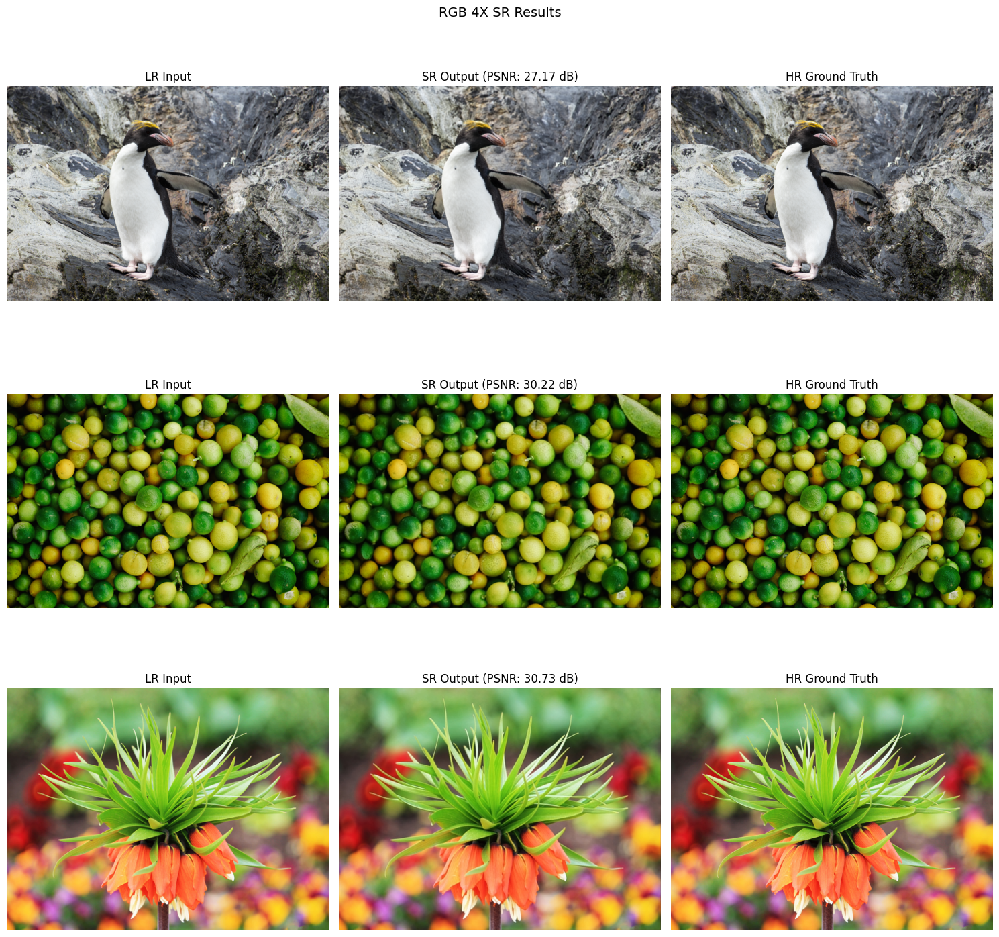

In [17]:
def show_sr_results(model, val_loader, device, title="SR Results", n=3):
    model.eval()
    fig, axes = plt.subplots(n, 3, figsize=(15, 5*n))
    shown = 0
    with torch.no_grad():
        for batch in val_loader:
            if shown >= n: break
            lr = batch['lr'].to(device)
            hr = batch['hr'].to(device)
            sr = model(lr)
            mse_val = F.mse_loss(sr, hr).item()
            p = psnr(mse_val)

            lr_img = lr[0].cpu().permute(1,2,0).clamp(0,1).numpy()
            sr_img = sr[0].cpu().permute(1,2,0).clamp(0,1).numpy()
            hr_img = hr[0].cpu().permute(1,2,0).clamp(0,1).numpy()

            axes[shown][0].imshow(lr_img); axes[shown][0].set_title("LR Input")
            axes[shown][1].imshow(sr_img); axes[shown][1].set_title(f"SR Output (PSNR: {p:.2f} dB)")
            axes[shown][2].imshow(hr_img); axes[shown][2].set_title("HR Ground Truth")
            for ax in axes[shown]: ax.axis('off')
            shown += 1

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, f"{title.replace(' ','_')}.png"), dpi=100)
    plt.show()

show_sr_results(model_rgb_collapsed, val_loader, DEVICE, title="RGB 4X SR Results")


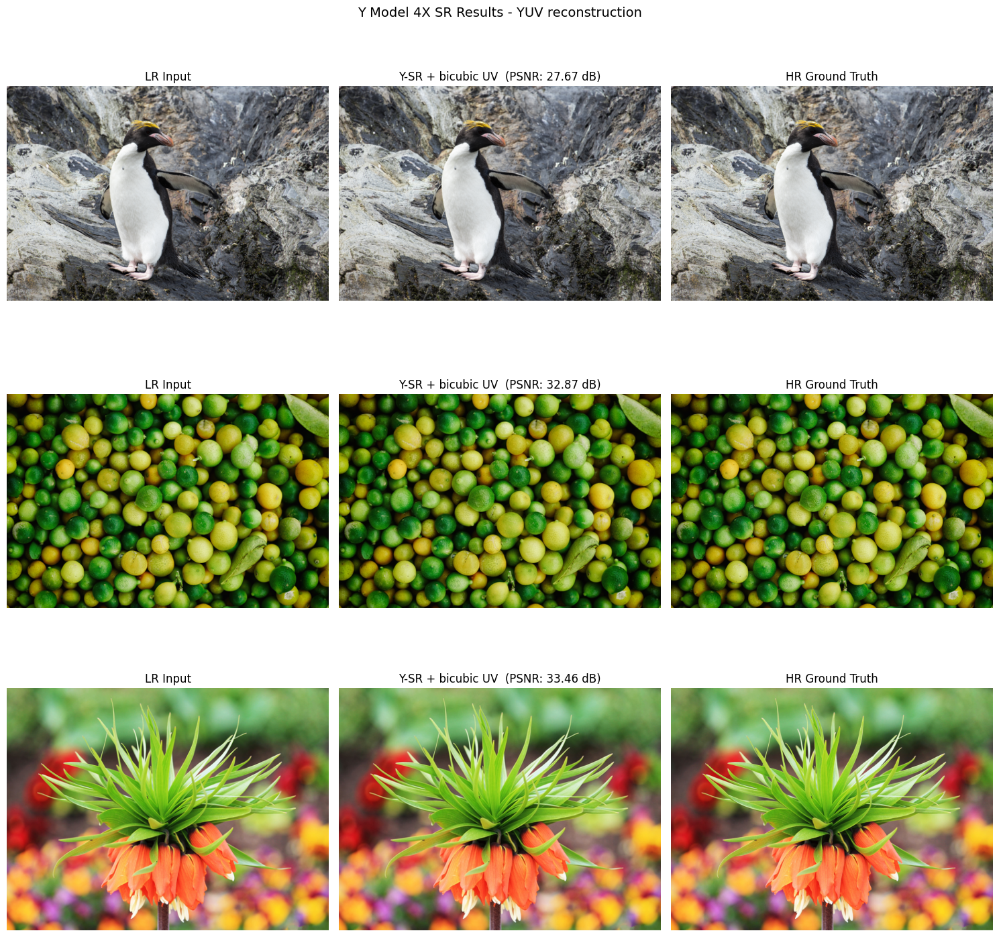

In [18]:
# ── Y model SR results with YUV reconstruction (per brief) ──
def show_y_model_sr_results(model_y, val_loader, device, scale,
                             title="Y Model 4X SR Results - YUV reconstruction", n=3):
    """Visualize Y-only model SR by recombining SR-Y with bicubic-upsampled UV."""
    model_y.eval()
    fig, axes = plt.subplots(n, 3, figsize=(15, 5*n))
    shown = 0
    with torch.no_grad():
        for batch in val_loader:
            if shown >= n: break
            lr_rgb = batch['lr'].to(device)
            hr_rgb = batch['hr'].to(device)
            sr_rgb = y_model_super_resolve(model_y, lr_rgb, scale, device)
            _, _, H, W = hr_rgb.shape
            sr_rgb = sr_rgb[..., :H, :W]
            mse_val = F.mse_loss(sr_rgb, hr_rgb).item()
            p = psnr(mse_val)

            lr_img = lr_rgb[0].cpu().permute(1,2,0).clamp(0,1).numpy()
            sr_img = sr_rgb[0].cpu().permute(1,2,0).clamp(0,1).numpy()
            hr_img = hr_rgb[0].cpu().permute(1,2,0).clamp(0,1).numpy()

            axes[shown][0].imshow(lr_img); axes[shown][0].set_title("LR Input")
            axes[shown][1].imshow(sr_img); axes[shown][1].set_title(f"Y-SR + bicubic UV  (PSNR: {p:.2f} dB)")
            axes[shown][2].imshow(hr_img); axes[shown][2].set_title("HR Ground Truth")
            for ax in axes[shown]: ax.axis('off')
            shown += 1

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    safe = title.replace(' ', '_').replace('-', '_').replace('/', '_')
    plt.savefig(os.path.join(RESULTS_DIR, f"{safe}.png"), dpi=100)
    plt.show()

show_y_model_sr_results(model_y, val_loader, DEVICE, UPSCALE)


In [19]:
# Sanity check: how well does plain bicubic do on val?  (RGB, full-image PSNR)
import torch.nn.functional as F

def bicubic_psnr(val_loader, scale=4):
    total_mse = 0.0
    n = 0
    for batch in val_loader:
        lr = batch['lr']
        hr = batch['hr']
        sr = F.interpolate(lr, scale_factor=scale,
                           mode='bicubic', align_corners=False).clamp(0, 1)
        sr = sr[..., :hr.size(-2), :hr.size(-1)]
        total_mse += F.mse_loss(sr, hr).item()
        n += 1
    avg_mse = total_mse / n
    return 10 * torch.log10(torch.tensor(1.0 / avg_mse)).item()

bicubic_baseline = bicubic_psnr(val_loader)
print(f"Bicubic 4X RGB PSNR on val:     {bicubic_baseline:.2f} dB")
print(f"Your RGB model:                 {best_psnr_rgb:.2f} dB")
print(f"Y-ch (with YUV reconstruction): {psnr_y_rgb_eq:.2f} dB")
print()
if psnr_y_rgb_eq > bicubic_baseline:
    print(f"  -> Y-ch model BEATS bicubic by {psnr_y_rgb_eq - bicubic_baseline:+.2f} dB")
if best_psnr_rgb > bicubic_baseline:
    print(f"  -> RGB model BEATS bicubic by {best_psnr_rgb - bicubic_baseline:+.2f} dB")


Bicubic 4X RGB PSNR on val:     25.07 dB
Your RGB model:                 24.50 dB
Y-ch (with YUV reconstruction): 24.97 dB



## 11. Quantization - Post-Training Quantization (PTQ)

In [20]:
try:
    from torch.ao.quantization import (
        QConfig, QConfigMapping, FakeQuantize,
        MinMaxObserver, PerChannelMinMaxObserver, disable_observer
    )
    from torch.ao.quantization.quantize_fx import prepare_qat_fx, convert_fx
except ImportError:
    from torch.quantization import (
        QConfig, QConfigMapping, FakeQuantize,
        MinMaxObserver, PerChannelMinMaxObserver, disable_observer
    )
    from torch.quantization.quantize_fx import prepare_qat_fx, convert_fx

# Use collapsed model for PTQ
ptq_base = copy.deepcopy(model_rgb_collapsed).cpu().eval()

# Calibration loader (small subset)
calib_subset  = Subset(val_dataset, list(range(20)))
calib_loader  = DataLoader(calib_subset, batch_size=1, shuffle=False)

backend = 'fbgemm'
torch.backends.quantized.engine = backend

def run_ptq(base_model, calib_loader, weight_observer, case_name):
    act_fq = FakeQuantize.with_args(observer=MinMaxObserver, dtype=torch.quint8,
                                     qscheme=torch.per_tensor_affine)
    w_fq   = FakeQuantize.with_args(observer=weight_observer,
                                     dtype=torch.qint8,
                                     qscheme=torch.per_channel_symmetric if weight_observer == PerChannelMinMaxObserver else torch.per_tensor_symmetric)
    qconfig = QConfig(activation=act_fq, weight=w_fq)
    qmap    = QConfigMapping().set_global(qconfig)
    ex_inp  = (next(iter(calib_loader))['lr'][:1],)

    prepared = prepare_qat_fx(copy.deepcopy(base_model).train(), qmap, ex_inp)
    prepared.eval()

    with torch.no_grad():
        for batch in calib_loader:
            prepared(batch['lr'])

    prepared.apply(disable_observer)

    # Evaluate PSNR
    total_mse = 0.0
    with torch.no_grad():
        for batch in val_loader:
            out = prepared(batch['lr'])
            total_mse += F.mse_loss(out, batch['hr']).item()
    total_mse /= len(val_loader)
    val_psnr = psnr(total_mse)
    print(f"PTQ {case_name}: PSNR = {val_psnr:.2f} dB")
    return prepared, val_psnr

ptq_pc_model, psnr_ptq_pc = run_ptq(ptq_base, calib_loader, PerChannelMinMaxObserver, 'Per-Channel')
ptq_pt_model, psnr_ptq_pt = run_ptq(ptq_base, calib_loader, MinMaxObserver,           'Per-Tensor')

print("\n=== PTQ Results ===")
print(f"Float PSNR:              {best_psnr_rgb:.2f} dB")
print(f"PTQ Per-Channel PSNR:    {psnr_ptq_pc:.2f} dB")
print(f"PTQ Per-Tensor PSNR:     {psnr_ptq_pt:.2f} dB")


PTQ Per-Channel: PSNR = 24.14 dB
PTQ Per-Tensor: PSNR = 24.33 dB

=== PTQ Results ===
Float PSNR:              24.50 dB
PTQ Per-Channel PSNR:    24.14 dB
PTQ Per-Tensor PSNR:     24.33 dB


## 12. Quantization - Quantization Aware Training (QAT)

In [21]:
def run_qat(base_model, train_loader, val_loader, weight_observer, case_name, num_epochs=5, lr=1e-5):
    act_fq  = FakeQuantize.with_args(observer=MinMaxObserver, dtype=torch.quint8,
                                      qscheme=torch.per_tensor_affine)
    w_fq    = FakeQuantize.with_args(observer=weight_observer, dtype=torch.qint8,
                                      qscheme=torch.per_channel_symmetric if weight_observer == PerChannelMinMaxObserver else torch.per_tensor_symmetric)
    qconfig = QConfig(activation=act_fq, weight=w_fq)
    qmap    = QConfigMapping().set_global(qconfig)
    ex_inp  = (next(iter(train_loader))['lr'][:1],)

    prepared = prepare_qat_fx(copy.deepcopy(base_model).train(), qmap, ex_inp)
    prepared = prepared.to(DEVICE)

    optimizer = optim.Adam(prepared.parameters(), lr=lr)
    criterion = nn.L1Loss()
    scaler    = GradScaler(AMP_DEVICE, enabled=USE_AMP)
    best_psnr_qat = 0.0

    for epoch in range(num_epochs):
        prepared.train()
        for batch in train_loader:
            lr_imgs = batch['lr'].to(DEVICE)
            hr_imgs = batch['hr'].to(DEVICE)
            optimizer.zero_grad()
            with autocast(AMP_DEVICE, enabled=USE_AMP):
                out  = prepared(lr_imgs)
                loss = criterion(out, hr_imgs)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

        prepared.eval()
        prepared.apply(disable_observer)
        total_mse = 0.0
        with torch.no_grad():
            for batch in val_loader:
                out = prepared(batch['lr'].to(DEVICE))
                total_mse += F.mse_loss(out, batch['hr'].to(DEVICE)).item()
        total_mse /= len(val_loader)
        ep_psnr = psnr(total_mse)
        best_psnr_qat = max(best_psnr_qat, ep_psnr)
        print(f"  QAT {case_name} Epoch [{epoch+1}/{num_epochs}] PSNR: {ep_psnr:.2f} dB")

    return prepared.cpu(), best_psnr_qat

print("Running QAT Per-Channel...")
qat_pc_model, psnr_qat_pc = run_qat(ptq_base, train_loader, val_loader, PerChannelMinMaxObserver, 'Per-Channel')

print("\nRunning QAT Per-Tensor...")
qat_pt_model, psnr_qat_pt = run_qat(ptq_base, train_loader, val_loader, MinMaxObserver, 'Per-Tensor')

print("\n=== QAT Results ===")
print(f"Float PSNR:              {best_psnr_rgb:.2f} dB")
print(f"QAT Per-Channel PSNR:    {psnr_qat_pc:.2f} dB")
print(f"QAT Per-Tensor PSNR:     {psnr_qat_pt:.2f} dB")


Running QAT Per-Channel...
  QAT Per-Channel Epoch [1/5] PSNR: 24.44 dB
  QAT Per-Channel Epoch [2/5] PSNR: 24.45 dB
  QAT Per-Channel Epoch [3/5] PSNR: 24.46 dB
  QAT Per-Channel Epoch [4/5] PSNR: 24.47 dB
  QAT Per-Channel Epoch [5/5] PSNR: 24.48 dB

Running QAT Per-Tensor...
  QAT Per-Tensor Epoch [1/5] PSNR: 24.45 dB
  QAT Per-Tensor Epoch [2/5] PSNR: 24.46 dB
  QAT Per-Tensor Epoch [3/5] PSNR: 24.46 dB
  QAT Per-Tensor Epoch [4/5] PSNR: 24.47 dB
  QAT Per-Tensor Epoch [5/5] PSNR: 24.48 dB

=== QAT Results ===
Float PSNR:              24.50 dB
QAT Per-Channel PSNR:    24.48 dB
QAT Per-Tensor PSNR:     24.48 dB


## 13. Quantization Results Visualization

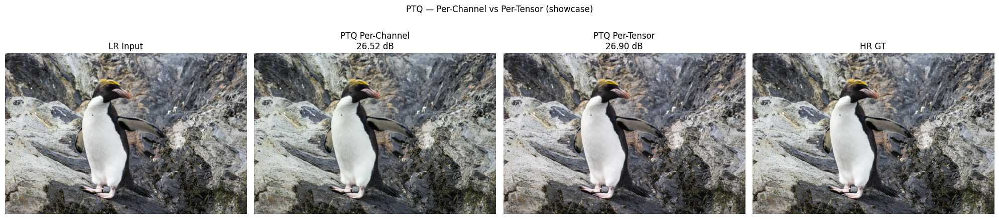

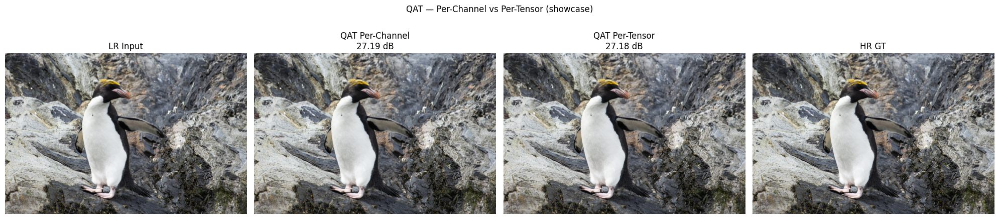

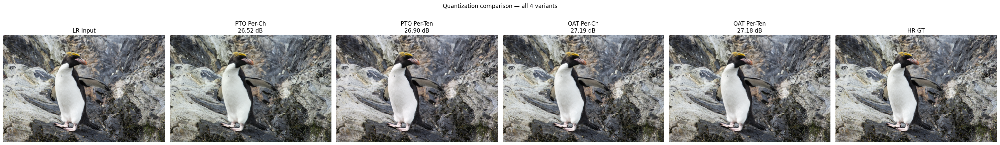

In [22]:
def show_quant_subset(models_dict, val_loader, title, save_name):
    """Generic SR visualization for a subset of quantized models (used for both PTQ-only and QAT-only)."""
    n_models = len(models_dict)
    sample = next(iter(val_loader))
    lr_img = sample['lr']
    hr_img = sample['hr']

    fig, axes = plt.subplots(1, n_models + 2, figsize=(5*(n_models+2), 5))
    axes[0].imshow(lr_img[0].permute(1,2,0).clamp(0,1).numpy())
    axes[0].set_title("LR Input"); axes[0].axis('off')

    for i, (name, model) in enumerate(models_dict.items()):
        model.eval()
        with torch.no_grad():
            out = model(lr_img)
        p = psnr(F.mse_loss(out, hr_img).item())
        axes[i+1].imshow(out[0].permute(1,2,0).clamp(0,1).numpy())
        axes[i+1].set_title(f"{name}\n{p:.2f} dB"); axes[i+1].axis('off')

    axes[-1].imshow(hr_img[0].permute(1,2,0).clamp(0,1).numpy())
    axes[-1].set_title("HR GT"); axes[-1].axis('off')
    plt.suptitle(title); plt.tight_layout()
    plt.savefig(os.path.join(RESULTS_DIR, save_name), dpi=100)
    plt.show()


# ── Showcase #1: PTQ only (per brief item 1) ──
show_quant_subset(
    {'PTQ Per-Channel': ptq_pc_model,
     'PTQ Per-Tensor':  ptq_pt_model},
    val_loader,
    title="PTQ — Per-Channel vs Per-Tensor (showcase)",
    save_name="ptq_showcase.png"
)

# ── Showcase #2: QAT only (per brief item 2) ──
show_quant_subset(
    {'QAT Per-Channel': qat_pc_model,
     'QAT Per-Tensor':  qat_pt_model},
    val_loader,
    title="QAT — Per-Channel vs Per-Tensor (showcase)",
    save_name="qat_showcase.png"
)

# ── Showcase #3: Combined 4-way comparison (bonus) ──
show_quant_subset(
    {'PTQ Per-Ch':  ptq_pc_model,
     'PTQ Per-Ten': ptq_pt_model,
     'QAT Per-Ch':  qat_pc_model,
     'QAT Per-Ten': qat_pt_model},
    val_loader,
    title="Quantization comparison — all 4 variants",
    save_name="quantization_comparison.png"
)


## 14. Pruning - Unstructured Pruning by Magnitude

In [23]:
import torch.nn.utils.prune as prune

def evaluate_psnr(model, val_loader, device):
    model.eval()
    total_mse = 0.0
    with torch.no_grad():
        for batch in val_loader:
            out = model(batch['lr'].to(device))
            total_mse += F.mse_loss(out, batch['hr'].to(device)).item()
    return psnr(total_mse / len(val_loader))

def fine_tune(model, train_loader, val_loader, device, num_epochs=3, lr=1e-5):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.L1Loss()
    scaler = GradScaler(AMP_DEVICE, enabled=USE_AMP)
    best_psnr_ft = 0.0
    for epoch in range(num_epochs):
        model.train()
        for batch in train_loader:
            lr_imgs = batch['lr'].to(device)
            hr_imgs = batch['hr'].to(device)
            optimizer.zero_grad()
            with autocast(AMP_DEVICE, enabled=USE_AMP):
                loss = criterion(model(lr_imgs), hr_imgs)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        ep_psnr = evaluate_psnr(model, val_loader, device)
        best_psnr_ft = max(best_psnr_ft, ep_psnr)
        print(f"  Fine-tune Epoch [{epoch+1}/{num_epochs}] PSNR: {ep_psnr:.2f} dB")
    return model, best_psnr_ft


# ── Load and collapse fresh model for pruning ──
prune_model = RPQNet_WSDR_EV2(in_channels=3, num_features=48, num_blocks=6,
                              upscale=UPSCALE, expand_ratio=4)
prune_model.load_state_dict(torch.load(f'{SAVE_DIR}/rgb_4x_best.pth',
                                        map_location='cpu', weights_only=True))
prune_model.switch_to_deploy()
prune_model = prune_model.to(DEVICE)

psnr_before_prune = evaluate_psnr(prune_model, val_loader, DEVICE)
print(f"PSNR before pruning: {psnr_before_prune:.2f} dB\n")

# ── ITERATIVE pruning (per brief: "iteratively with fine-tuning") ──
prune_results = []
target_sparsities = [0.10, 0.30, 0.50]

current_model = copy.deepcopy(prune_model)

for target_sparsity in target_sparsities:
    print(f"=== Iterative step: total sparsity {int(target_sparsity*100)}% ===")

    for name, module in current_model.named_modules():
        if isinstance(module, nn.Conv2d):
            prune.l1_unstructured(module, name='weight', amount=target_sparsity)
            prune.remove(module, 'weight')

    total = 0; zeros = 0
    for name, module in current_model.named_modules():
        if isinstance(module, nn.Conv2d):
            w = module.weight.data
            total += w.numel()
            zeros += (w == 0).sum().item()
    achieved = zeros / total if total else 0.0

    psnr_after = evaluate_psnr(current_model, val_loader, DEVICE)
    print(f"  Achieved sparsity: {achieved*100:.1f}%  |  PSNR after pruning: {psnr_after:.2f} dB")

    current_model, psnr_ft = fine_tune(current_model, train_loader, val_loader,
                                        DEVICE, num_epochs=3)
    print(f"  PSNR after fine-tune: {psnr_ft:.2f} dB\n")

    prune_results.append({
        'sparsity':       target_sparsity,
        'achieved':       achieved,
        'psnr_pruned':    psnr_after,
        'psnr_finetuned': psnr_ft,
    })

print("=" * 60)
print("=== Iterative Unstructured Pruning Results ===")
print("=" * 60)
print(f"{'Target':>7} {'Achieved':>9} {'After Prune':>13} {'After FT':>11}")
for r in prune_results:
    print(f"{int(r['sparsity']*100):>6}% {r['achieved']*100:>8.1f}% "
          f"{r['psnr_pruned']:>13.2f} {r['psnr_finetuned']:>11.2f}")


PSNR before pruning: 24.48 dB

=== Iterative step: total sparsity 10% ===
  Achieved sparsity: 10.0%  |  PSNR after pruning: 24.28 dB
  Fine-tune Epoch [1/3] PSNR: 24.48 dB
  Fine-tune Epoch [2/3] PSNR: 24.49 dB
  Fine-tune Epoch [3/3] PSNR: 24.50 dB
  PSNR after fine-tune: 24.50 dB

=== Iterative step: total sparsity 30% ===
  Achieved sparsity: 30.0%  |  PSNR after pruning: 21.40 dB
  Fine-tune Epoch [1/3] PSNR: 24.27 dB
  Fine-tune Epoch [2/3] PSNR: 24.36 dB
  Fine-tune Epoch [3/3] PSNR: 24.41 dB
  PSNR after fine-tune: 24.41 dB

=== Iterative step: total sparsity 50% ===
  Achieved sparsity: 50.0%  |  PSNR after pruning: 17.41 dB
  Fine-tune Epoch [1/3] PSNR: 22.26 dB
  Fine-tune Epoch [2/3] PSNR: 23.58 dB
  Fine-tune Epoch [3/3] PSNR: 23.81 dB
  PSNR after fine-tune: 23.81 dB

=== Iterative Unstructured Pruning Results ===
 Target  Achieved   After Prune    After FT
    10%     10.0%         24.28       24.50
    30%     30.0%         21.40       24.41
    50%     50.0%         17

## 15. Pruning - Layer-wise Pruning by PSNR Sensitivity

In [24]:
# PSNR sensitivity: prune each layer individually and measure drop
prune_model.eval()
layer_sensitivity = []

conv_layers = [(name, m) for name, m in prune_model.named_modules() if isinstance(m, nn.Conv2d)]
print(f"Total conv layers: {len(conv_layers)}")
print("Measuring sensitivity (this may take a while)...")

for layer_name, layer_module in conv_layers:  # Test ALL conv layers
    model_test = copy.deepcopy(prune_model)
    # Find and prune just this layer
    for name, module in model_test.named_modules():
        if name == layer_name and isinstance(module, nn.Conv2d):
            prune.l1_unstructured(module, name='weight', amount=0.5)
            prune.remove(module, 'weight')
            break
    p = evaluate_psnr(model_test, val_loader, DEVICE)
    drop = psnr_before_prune - p
    layer_sensitivity.append({'layer': layer_name, 'psnr': p, 'drop': drop})
    print(f"  {layer_name[:40]:40} PSNR: {p:.2f} dB (drop: {drop:.2f})")

# Sort by sensitivity (least sensitive first = best candidates for pruning)
layer_sensitivity.sort(key=lambda x: x['drop'])

print("\n=== Layer Sensitivity (least sensitive first) ===")
for i, ls in enumerate(layer_sensitivity[:5]):
    print(f"{i+1}. {ls['layer'][:40]:40} drop: {ls['drop']:.2f} dB")

# Prune least sensitive layers and fine-tune
print("\nPruning least sensitive layers...")
model_layerwise = copy.deepcopy(prune_model)
for ls in layer_sensitivity[:3]:  # Prune 3 least sensitive
    for name, module in model_layerwise.named_modules():
        if name == ls['layer'] and isinstance(module, nn.Conv2d):
            prune.l1_unstructured(module, name='weight', amount=0.5)
            prune.remove(module, 'weight')
            break

psnr_lw_before_ft = evaluate_psnr(model_layerwise, val_loader, DEVICE)
print(f"PSNR after layer-wise pruning: {psnr_lw_before_ft:.2f} dB")

model_layerwise, psnr_lw_ft = fine_tune(model_layerwise, train_loader, val_loader, DEVICE, num_epochs=5)
print(f"PSNR after fine-tuning: {psnr_lw_ft:.2f} dB")


Total conv layers: 16
Measuring sensitivity (this may take a while)...
  initial.0                                PSNR: 21.79 dB (drop: 2.69)
  skip_a                                   PSNR: 21.42 dB (drop: 3.06)
  skip_b                                   PSNR: 20.89 dB (drop: 3.59)
  blocks_a.0.conv_reparam                  PSNR: 24.45 dB (drop: 0.03)
  blocks_a.1.conv_reparam                  PSNR: 24.45 dB (drop: 0.03)
  blocks_a.2.conv_reparam                  PSNR: 24.45 dB (drop: 0.03)
  blocks_a.3.conv_reparam                  PSNR: 24.44 dB (drop: 0.04)
  blocks_a.4.conv_reparam                  PSNR: 24.41 dB (drop: 0.07)
  blocks_a.5.conv_reparam                  PSNR: 24.27 dB (drop: 0.21)
  blocks_b.0.conv_reparam                  PSNR: 24.44 dB (drop: 0.04)
  blocks_b.1.conv_reparam                  PSNR: 24.45 dB (drop: 0.02)
  blocks_b.2.conv_reparam                  PSNR: 24.46 dB (drop: 0.01)
  blocks_b.3.conv_reparam                  PSNR: 24.39 dB (drop: 0.08)
  bloc

## 16. Final Summary

In [25]:
# ──────────────────────────────────────────────────────────────────────
# Final summary — cross-reference with project brief
# ──────────────────────────────────────────────────────────────────────
print("=" * 64)
print("ENNCA2026 PROJECT FINAL SUMMARY  -  Student 342050  (4X)")
print("=" * 64)

print("\n── Float Training (RGB) ──")
print(f"  Best val PSNR (full RGB):   {best_psnr_rgb:.2f} dB")
print(f"  Params:                     {count_params(model_rgb):,}")
print(f"  FLOPs (64x64 input):        {flops_rgb:,}")

print("\n── Float Training (Y-channel only, with YUV reconstruction) ──")
print(f"  Y-only val PSNR:            {best_psnr_y:.2f} dB   (luma only)")
print(f"  RGB-equivalent PSNR:        {psnr_y_rgb_eq:.2f} dB   (SR-Y + bicubic UV → RGB, per brief)")
print(f"  Params:                     {count_params(model_y):,}")
print(f"  FLOPs (64x64 input):        {flops_y:,}")

print("\n── Collapse (RPQNet reparameterization) ──")
print(f"  Params before / after:      {count_params(model_rgb):,} / {count_params(model_rgb_collapsed):,}")
print(f"  FLOPs  before / after:      {flops_before:,} / {flops_after:,}")
print(f"  MSE pre/post collapse:      {mse_collapse:.8f}")

print("\n── Quantization ──")
print(f"  Float baseline PSNR:        {best_psnr_rgb:.2f} dB")
print(f"  PTQ Per-Channel:            {psnr_ptq_pc:.2f} dB")
print(f"  PTQ Per-Tensor :            {psnr_ptq_pt:.2f} dB")
print(f"  QAT Per-Channel:            {psnr_qat_pc:.2f} dB")
print(f"  QAT Per-Tensor :            {psnr_qat_pt:.2f} dB")

print("\n── Pruning (Unstructured magnitude + 3-epoch fine-tune) ──")
for r in prune_results:
    print(f"  Sparsity {int(r['sparsity']*100):>2}%:  pruned {r['psnr_pruned']:>6.2f} dB  →  fine-tuned {r['psnr_finetuned']:>6.2f} dB")

print("\n── Pruning (Layer-wise by PSNR sensitivity) ──")
print(f"  After fine-tune:            {psnr_lw_ft:.2f} dB")
print("=" * 64)


ENNCA2026 PROJECT FINAL SUMMARY  -  Student 342050  (4X)

── Float Training (RGB) ──
  Best val PSNR (full RGB):   24.50 dB
  Params:                     1,671,456
  FLOPs (64x64 input):        12,964,331,520

── Float Training (Y-channel only, with YUV reconstruction) ──
  Y-only val PSNR:            25.03 dB   (luma only)
  RGB-equivalent PSNR:        24.97 dB   (SR-Y + bicubic UV → RGB, per brief)
  Params:                     1,645,792
  FLOPs (64x64 input):        12,754,878,464

── Collapse (RPQNet reparameterization) ──
  Params before / after:      1,671,456 / 117,984
  FLOPs  before / after:      12,964,331,520 / 960,233,472
  MSE pre/post collapse:      0.00001686

── Quantization ──
  Float baseline PSNR:        24.50 dB
  PTQ Per-Channel:            24.14 dB
  PTQ Per-Tensor :            24.33 dB
  QAT Per-Channel:            24.48 dB
  QAT Per-Tensor :            24.48 dB

── Pruning (Unstructured magnitude + 3-epoch fine-tune) ──
  Sparsity 10%:  pruned  24.28 dB  →  fine